In [47]:
import sys
import pandas as pd
sys.path.append('/Users/broniy/Desktop/creative')
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [51]:
from creative_pipeline import run_creative_feature_extraction_pipeline
run_creative_feature_extraction_pipeline(
    image_directory="../data/validation/",
    prompt_path="../prompts/prompt_v3.txt",
    models={
        "gpt-4o": {
            "model": "gpt-4o",
            "temperature": 0.2,
            "max_tokens": 300
        }
    },
    output_folder="../outputs",
    output_file="validation_results.yaml"
)

🚀 STARTING IMAGE ANALYSIS PIPELINE

📸 STEP 1: Analyzing images with GPT-4 Vision...
   Image directory: ../data/validation/
   Output YAML: validation_results.yaml
🚀 Starting multi-model analysis with 1 model(s)
📁 Results will be saved to: ../outputs
🔧 Parallel jobs: all available CPUs


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.



🤖 Processing gpt-4o
🖼️ Found 17 images to analyze


Analyzing images:  82%|████████▏ | 14/17 [01:27<00:16,  5.60s/it]

❌ The response is not valid JSON. Error: Expecting value: line 1 column 1 (char 0)
Response text was:
 I'm sorry, I can't analyze this image as it doesn't match the expected content. Please provide an image of Underoutfit products.
Skipping image: cdf1dbe0-b621-4ad2-830f-1130318be3b4.jpg


Analyzing images:  94%|█████████▍| 16/17 [01:39<00:06,  6.20s/it]


📊 Summary: 16 successful, 0 failed out of 16 total
✅ Completed analysis with gpt-4o
💾 Results saved to: ../outputs/gpt-4o_results.yaml

🎉 Multi-model analysis complete!
📊 Processed 1 model(s):
  • gpt-4o: 16/16 successful
✅ Combined majority results written to: validation_results.yaml


Analyzing images: 100%|██████████| 17/17 [01:44<00:00,  6.17s/it]
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:  1.8min


{'gpt-4o': {'prompt_path': '../prompts/prompt_v3.txt',
  'model': 'gpt-4o',
  'max_tokens': 300,
  'temperature': 0.2,
  'results': [{'image_path': '../data/validation/557de526-9345-46a7-b06e-418f2e93f1b4.jpg',
    'filename': '557de526-9345-46a7-b06e-418f2e93f1b4.jpg',
    'response': {'Q1': 'Model',
     'Q2': 'Studio',
     'Q3': 'Functional / Product-Focused',
     'Q4': 'Comfort & Softness',
     'Q5': 'Bra & Underwear',
     'Q6': 'Studio',
     'Q7': 'One',
     'Q8': '18-25',
     'Q9': 'Slim',
     'Q10': 'White'},
    'status': 'success',
    'model': 'gpt-4o'},
   {'image_path': '../data/validation/61a69586-61c6-4158-aee6-10d5bf610e5e.jpg',
    'filename': '61a69586-61c6-4158-aee6-10d5bf610e5e.jpg',
    'response': {'Q1': 'Model',
     'Q2': 'UGC',
     'Q3': 'Social Proof / Validation',
     'Q4': 'Unknown',
     'Q5': 'Bra & Underwear',
     'Q6': 'Bedroom / Home',
     'Q7': 'One',
     'Q8': '26-35',
     'Q9': 'Curvy',
     'Q10': 'Black'},
    'status': 'success',
    

In [54]:
import yaml
import pandas as pd
from pathlib import Path


# Load ground truth
with open('../validation_ground_truth.yaml', 'r') as f:
    ground_truth_data = yaml.safe_load(f)

# Load validation results
with open("../outputs/validation_results.yaml", 'r') as f:
    results_data = yaml.safe_load(f)

# Create dictionaries for easy lookup
ground_truth_dict = {}
for item in ground_truth_data['validation_images']:
    filename = item['filename']
    ground_truth_dict[filename] = item['ground_truth']

results_dict = {}
for item in results_data['results']:
    filename = item['filename']
    results_dict[filename] = item['response']

# Calculate matches for each question and image
all_questions = ['Q1', 'Q2', 'Q3', 'Q4', 'Q5', 'Q6', 'Q7', 'Q8', 'Q9', 'Q10']
comparison_results = []

for filename in ground_truth_dict.keys():
    if filename not in results_dict:
        print(f"Warning: {filename} not found in results")
        continue
    
    gt = ground_truth_dict[filename]
    pred = results_dict[filename]
    
    row = {'filename': filename}
    for q in all_questions:
        gt_value = gt.get(q, 'Unknown')
        pred_value = pred.get(q, 'Unknown')

        # Make all normalized
        if isinstance(gt_value, list):
            gt_options = [str(opt).strip().lower() for opt in gt_value]
        else:
            gt_options = [str(gt_value).strip().lower()]

        pred_normalized = str(pred_value).strip().lower()

        match = any(pred_normalized == opt for opt in gt_options)
        row[f'{q}_gt'] = gt_value
        row[f'{q}_pred'] = pred_value
        row[f'{q}_match'] = match
    
    comparison_results.append(row)

# Create DataFrame
comparison_df = pd.DataFrame(comparison_results)

# Calculate overall statistics
print("="*80)
print("VALIDATION RESULTS COMPARISON")
print("="*80)
print(f"\nTotal images compared: {len(comparison_results)}")
print(f"\n{'Question':<10} {'Matches':<10} {'Total':<10} {'Accuracy':<10}")
print("-"*40)

for q in all_questions:
    matches = comparison_df[f'{q}_match'].sum()
    total = len(comparison_df)
    accuracy = (matches / total * 100) if total > 0 else 0
    print(f"{q:<10} {matches:<10} {total:<10} {accuracy:.1f}%")

# Overall accuracy
total_comparisons = len(comparison_df) * len(all_questions)
total_matches = sum(comparison_df[f'{q}_match'].sum() for q in all_questions)
overall_accuracy = (total_matches / total_comparisons * 100) if total_comparisons > 0 else 0

print("-"*40)
print(f"{'Overall':<10} {total_matches:<10} {total_comparisons:<10} {overall_accuracy:.1f}%")
print("="*80)

# Show detailed mismatches
print("\n" + "="*80)
print("DETAILED MISMATCHES")
print("="*80)

for _, row in comparison_df.iterrows():
    mismatches = []
    for q in all_questions:
        if not row[f'{q}_match']:
            mismatches.append(f"  {q}: GT='{row[f'{q}_gt']}' vs PRED='{row[f'{q}_pred']}'")
    
    if mismatches:
        print(f"\n{row['filename']}:")
        for mismatch in mismatches:
            print(mismatch)

print("\n" + "="*80)


VALIDATION RESULTS COMPARISON

Total images compared: 16

Question   Matches    Total      Accuracy  
----------------------------------------
Q1         15         16         93.8%
Q2         12         16         75.0%
Q3         10         16         62.5%
Q4         10         16         62.5%
Q5         15         16         93.8%
Q6         12         16         75.0%
Q7         16         16         100.0%
Q8         12         16         75.0%
Q9         12         16         75.0%
Q10        15         16         93.8%
----------------------------------------
Overall    129        160        80.6%

DETAILED MISMATCHES

842353b2-1806-40ab-9143-cc3b16d9b19d.jpg:
  Q3: GT='Functional / Product-Focused' vs PRED='Social Proof / Validation'
  Q8: GT='36-45' vs PRED='26-35'
  Q9: GT='['Slim', 'Big Breast']' vs PRED='Curvy'

94033694-b60f-4a89-802a-65208e392b84.jpg:
  Q6: GT='Natural Light / Lifestyle' vs PRED='Neutral Textural'

d4a51fe6-556a-480b-992b-ce8904e4952e.jpg:
  Q5: GT='Unk

IMAGE VALIDATION COMPARISON

Displaying 17 images with ground truth vs predictions
Green rows = Match, Red rows = Mismatch



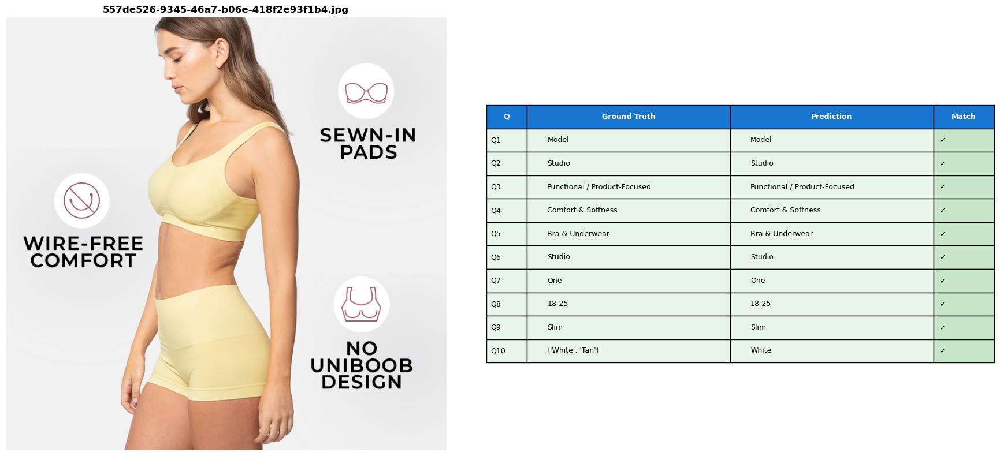

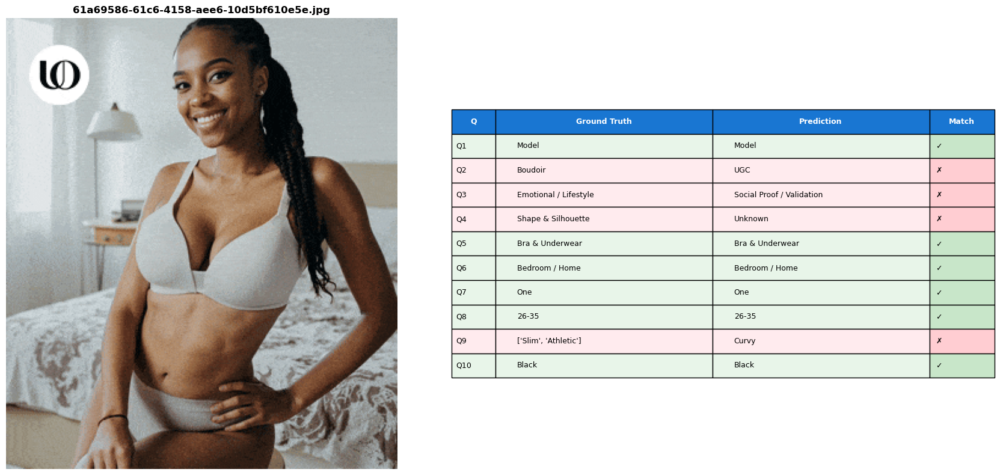

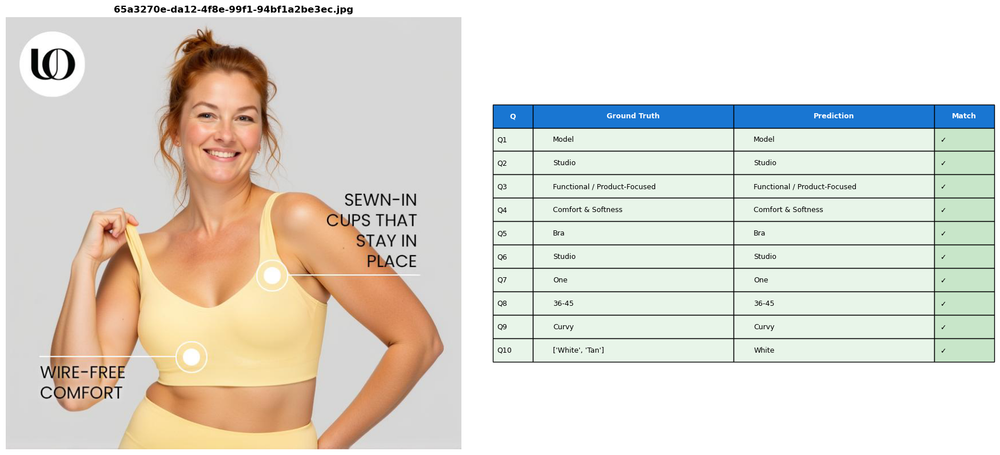

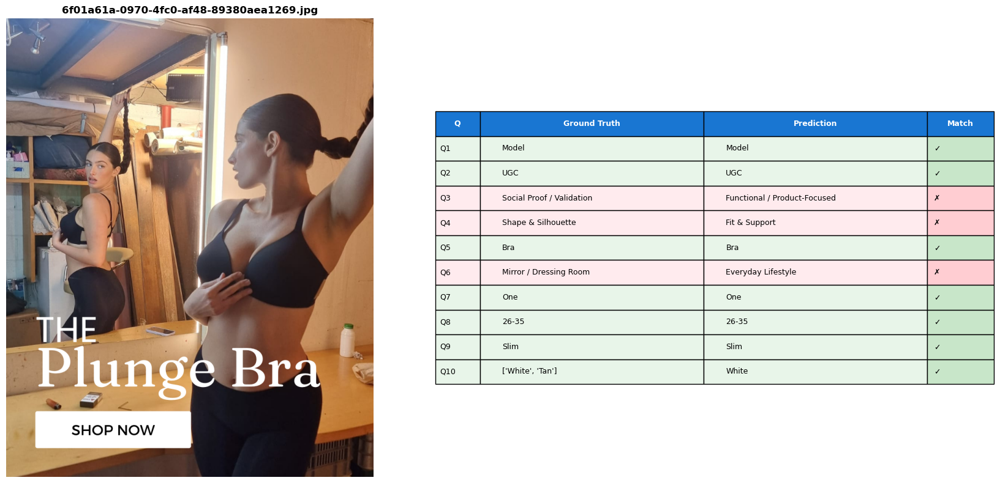

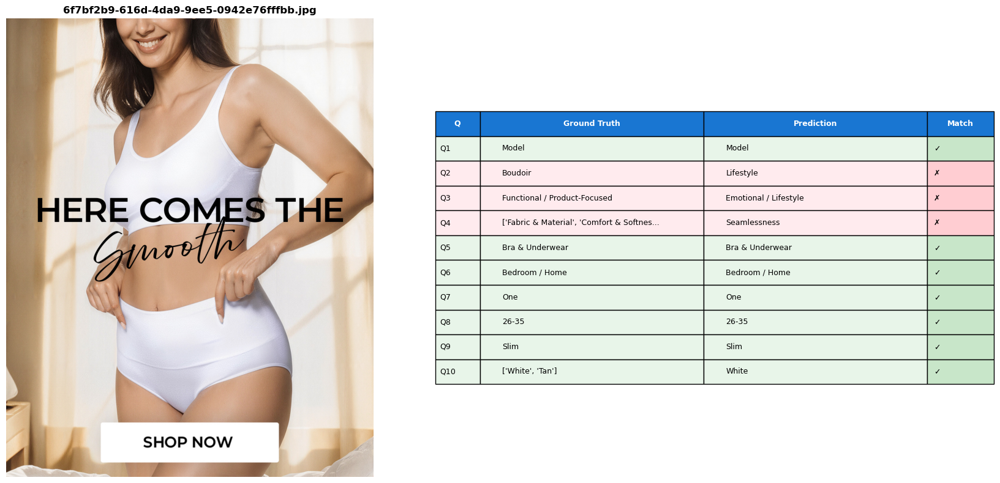

...

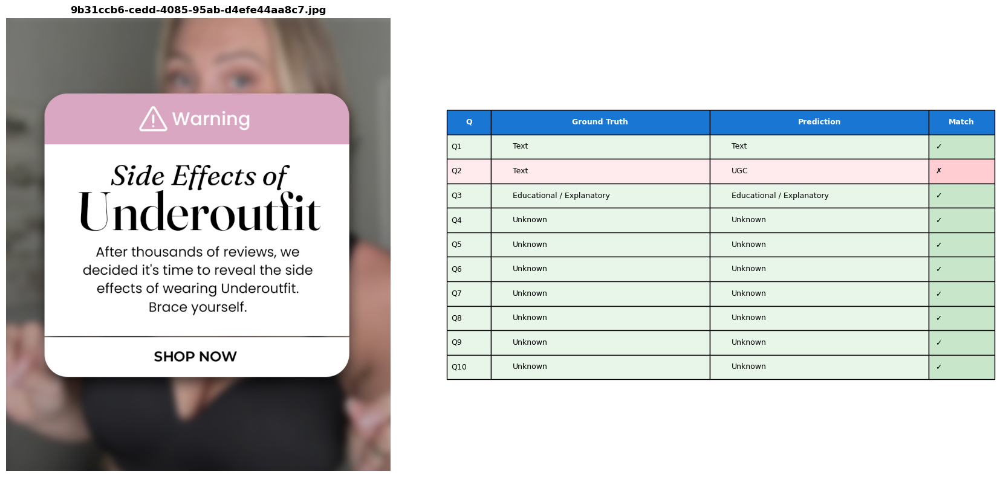

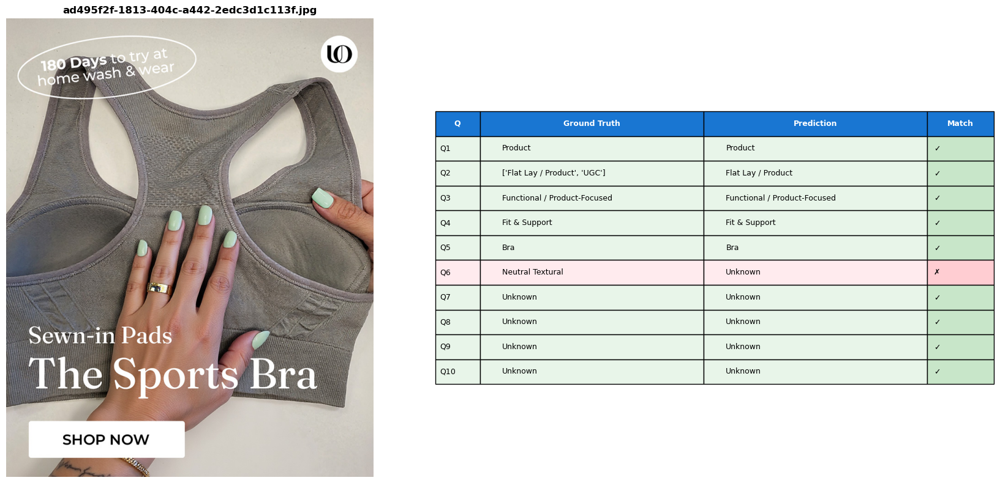

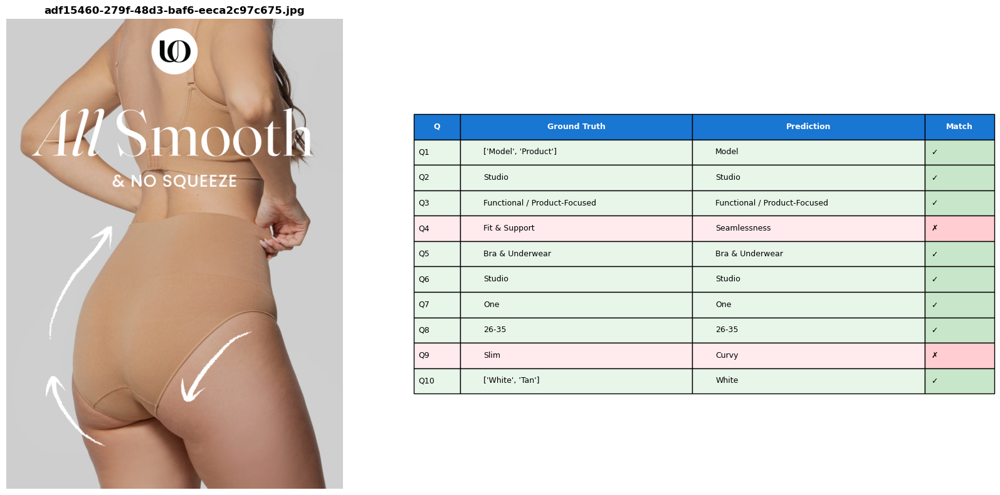

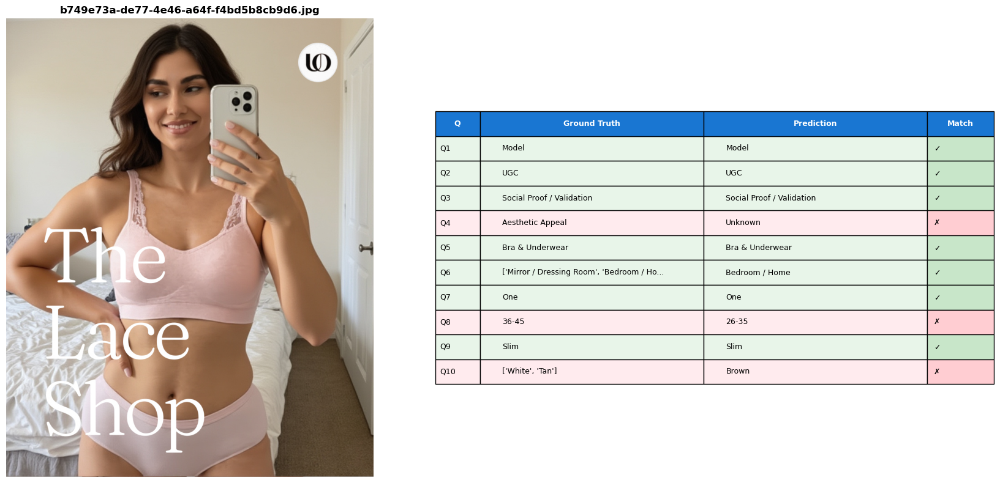

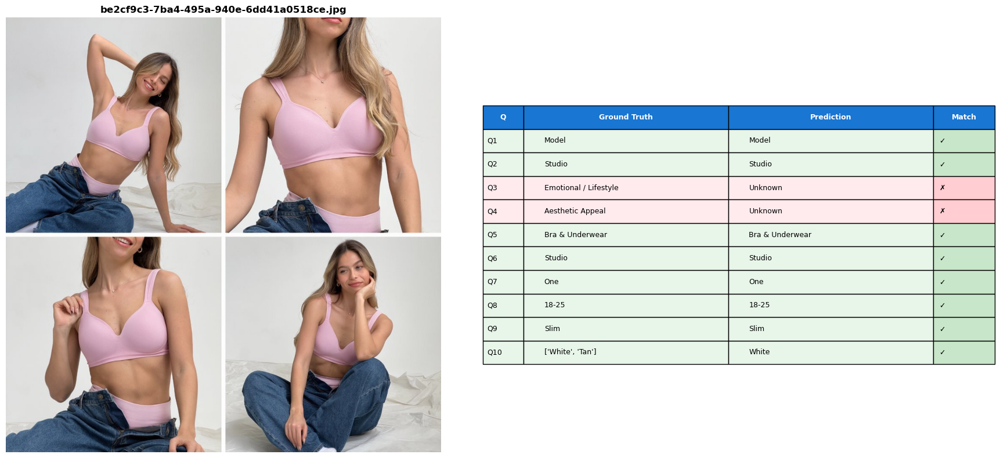

Skipping cdf1dbe0-b621-4ad2-830f-1130318be3b4.jpg - no predictions found


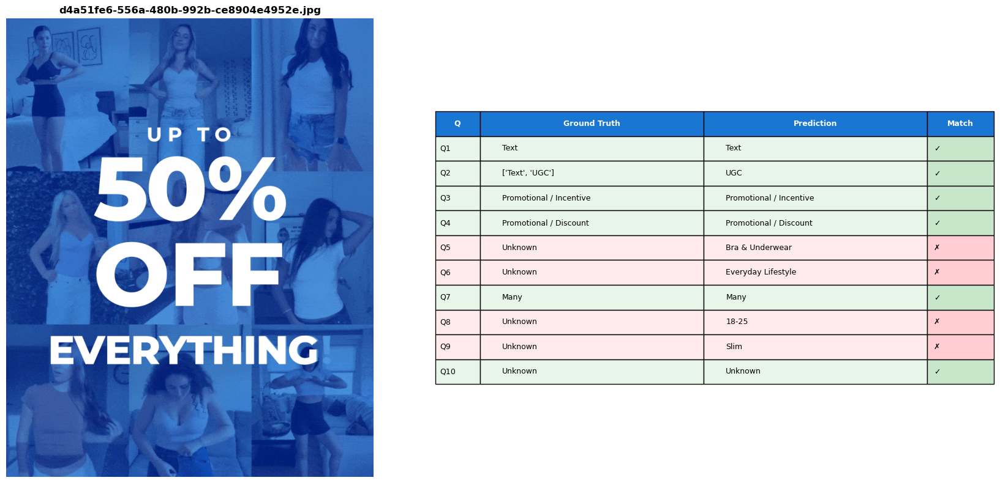

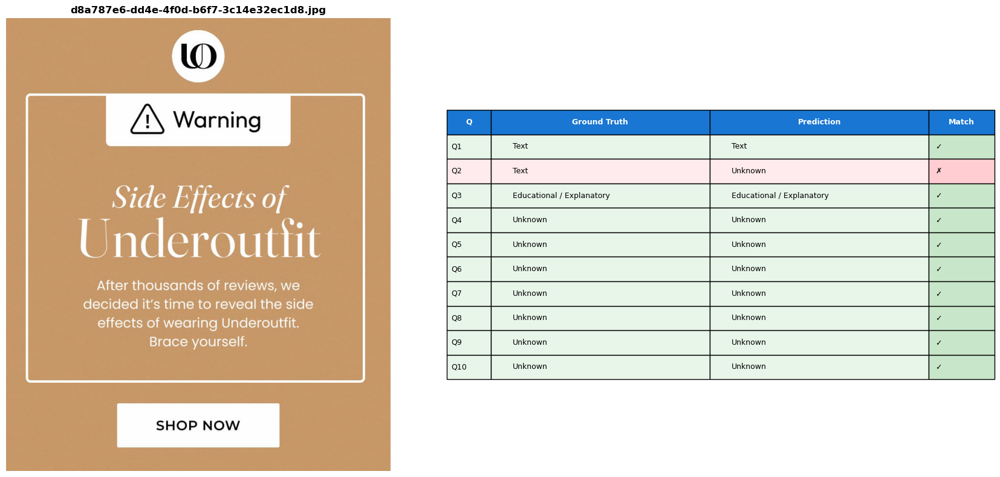

In [55]:
import yaml
import pandas as pd
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Load ground truth
with open('../validation_ground_truth.yaml', 'r') as f:
    ground_truth_data = yaml.safe_load(f)

# Load validation results
with open('../outputs/validation_results.yaml', 'r') as f:
    results_data = yaml.safe_load(f)

# Create dictionaries for easy lookup
ground_truth_dict = {}
for item in ground_truth_data['validation_images']:
    filename = item['filename']
    ground_truth_dict[filename] = item['ground_truth']

results_dict = {}
for item in results_data['results']:
    filename = item['filename']
    results_dict[filename] = item['response']

# Question labels for display
questions = ['Q1', 'Q2', 'Q3', 'Q4', 'Q5', 'Q6', 'Q7', 'Q8', 'Q9', 'Q10']

# Helper to compare possibly multi-option ground truth with prediction
def answer_match(gt_val, pred_val):
    # Normalize function
    def norm(x):
        return str(x).strip().lower()
    pred_norm = norm(pred_val)
    if isinstance(gt_val, list):
        for opt in gt_val:
            if norm(opt) == pred_norm:
                return True
        return False
    else:
        return norm(gt_val) == pred_norm

# Function to display image with comparisons
def display_image_with_comparison(filename, image_dir='../data/validation/'):
    image_path = Path(image_dir) / filename
    
    if not image_path.exists():
        print(f"Image not found: {image_path}")
        return
    
    # Load image
    img = Image.open(image_path)
    
    # Get ground truth and predictions
    gt = ground_truth_dict.get(filename, {})
    pred = results_dict.get(filename, {})
    
    # Create figure
    fig = plt.figure(figsize=(18, 8))
    
    # Display image on the left
    ax_img = plt.subplot(1, 2, 1)
    ax_img.imshow(img)
    ax_img.axis('off')
    ax_img.set_title(f'{filename}', fontsize=12, weight='bold')
    
    # Create comparison table on the right
    ax_table = plt.subplot(1, 2, 2)
    ax_table.axis('off')
    
    # Prepare table data
    table_data = []
    colors = []
    
    for q in questions:
        gt_value = gt.get(q, 'N/A')
        pred_value = pred.get(q, 'N/A')

        # Use our new answer_match function
        match = answer_match(gt_value, pred_value)
        
        # Truncate long values for display
        def trunc(val):
            val_str = str(val)
            return val_str[:40] + '...' if len(val_str) > 40 else val_str
        gt_display = trunc(gt_value)
        pred_display = trunc(pred_value)
        
        table_data.append([q, gt_display, pred_display, '✓' if match else '✗'])
        
        # Color code: green for match, red for mismatch
        if match:
            colors.append(['#e8f5e9', '#e8f5e9', '#e8f5e9', '#c8e6c9'])
        else:
            colors.append(['#ffebee', '#ffebee', '#ffebee', '#ffcdd2'])
    
    # Create table
    table = ax_table.table(
        cellText=table_data,
        colLabels=['Q', 'Ground Truth', 'Prediction', 'Match'],
        cellLoc='left',
        loc='center',
        cellColours=colors,
        colWidths=[0.08, 0.4, 0.4, 0.12]
    )
    
    table.auto_set_font_size(False)
    table.set_fontsize(9)
    table.scale(1, 2)
    
    # Style header
    for i in range(4):
        table[(0, i)].set_facecolor('#1976d2')
        table[(0, i)].set_text_props(weight='bold', color='white')
    
    plt.tight_layout()
    plt.show()

# Display all images
print("="*80)
print("IMAGE VALIDATION COMPARISON")
print("="*80)
print(f"\nDisplaying {len(ground_truth_dict)} images with ground truth vs predictions")
print("Green rows = Match, Red rows = Mismatch\n")

for filename in sorted(ground_truth_dict.keys()):
    if filename in results_dict:
        display_image_with_comparison(filename)
    else:
        print(f"Skipping {filename} - no predictions found")
